In [1]:
import pandas as pd
from lifelines import CoxPHFitter
from lifelines.datasets import load_rossi

/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
from lifelines import WeibullFitter

In [3]:
lax_caus = pd.read_csv(r'/Users/hernanadasme/Projects/bom/2023-02-22-BodleianV1-weeklybills-parishes.csv', sep=',')

In [4]:
lax_caus.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301 entries, 0 to 300
Columns: 802 entries, Omeka Item # to is_illegible.265
dtypes: float64(783), int64(16), object(3)
memory usage: 1.8+ MB


In [7]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [9]:
lax_caus

,Omeka Item #,DataScribe Item #,DataScribe Record #,DataScribe Record Position,Year,is_missing,is_illegible,Week,is_missing.1,is_illegible.1,Unique ID,is_missing.2,is_illegible.2,Start Day,is_missing.3,is_illegible.3,Start Month,is_missing.4,is_illegible.4,End Day,is_missing.5,is_illegible.5,End month,is_missing.6,is_illegible.6,St Alban Woodstreet - Buried,is_missing.7,is_illegible.7,St Alban Woodstreet - Plague,is_missing.8,is_illegible.8,Alhallows Barking - Buried,is_missing.9,is_illegible.9,Alhallows Barking - Plague,is_missing.10,is_illegible.10,Alhallows Breadstreet - Buried,is_missing.11,is_illegible.11,Alhallows Breadstreet - Plague,is_missing.12,is_illegible.12,Alhallows Great - Buried,is_missing.13,is_illegible.13,Alhallows Great - Plague,is_missing.14,is_illegible.14,Alhallows Honylane - Buried,is_missing.15,is_illegible.15,Alhallows Honylane - Plague,is_missing.16,is_illegible.16,Alhallows Lesse - Buried,is_missing.17,is_illegible.17,Alhallows Lesse - Plague,is_missing.18,is_illegible.18,Alhallows Lumbardstreet - Buried,is_missing.19,is_illegible.19,Alhallows Lumbardstreet - Plague,is_missing.20,is_illegible.20,Alhallows Stayning - Buried,is_missing.21,is_illegible.21,Alhallows Stayning - Plague,is_missing.22,is_illegible.22,Alhallows the Wall - Buried,is_missing.23,is_illegible.23,Alhallows the Wall - Plague,is_missing.24,is_illegible.24,St Alphage - Buried,is_missing.25,is_illegible.25,St Alphage - Plague,is_missing.26,is_illegible.26,St Andrew Hubbard - Buried,is_missing.27,is_illegible.27,St Andrew Hubbard - Plague,is_missing.28,is_illegible.28,St Andrew Undershaft - Buried,is_missing.29,is_illegible.29,St Andrew Undershaft - Plague,is_missing.30,is_illegible.30,St Andrew Wardrobe - Buried,is_missing.31,is_illegible.31,St Andrew Wardrobe - Plague,is_missing.32,is_illegible.32,St Ann Aldersgate - Buried,is_missing.33,is_illegible.33,St Ann Aldersgate - Plague,is_missing.34,is_illegible.34,St Ann Blackfryers - Buried,is_missing.35,is_illegible.35,St Ann Blackfryers - Plague,is_missing.36,is_illegible.36,St Antholins Parish - Buried,is_missing.37,is_illegible.37,St Antholins Parish - Plague,is_missing.38,is_illegible.38,St Austins Parish - Buried,is_missing.39,is_illegible.39,St Austins Parish - Plague,is_missing.40,is_illegible.40,St Bartholomew Exchange - Buried,is_missing.41,is_illegible.41,St Bartholomew Exchange - Plague,is_missing.42,is_illegible.42,St Bennet Fynck - Buried,is_missing.43,is_illegible.43,St Bennet Fynck - Plague,is_missing.44,is_illegible.44,St Bennet Gracechurch - Buried,is_missing.45,is_illegible.45,St Bennet Gracechurch - Plague,is_missing.46,is_illegible.46,St Bennet Paulswharf - Buried,is_missing.47,is_illegible.47,St Bennet Paulswharf - Plague,is_missing.48,is_illegible.48,St Bennet Sherehog - Buried,is_missing.49,is_illegible.49,St Bennet Sherehog - Plague,is_missing.50,is_illegible.50,St Botolph Billingsgate - Buried,is_missing.51,is_illegible.51,St Botolph Billingsgate - Plague,is_missing.52,is_illegible.52,Christ Church - Buried,is_missing.53,is_illegible.53,Christ Church - Plague,is_missing.54,is_illegible.54,St Christophers - Buried,is_missing.55,is_illegible.55,St Christophers - Plague,is_missing.56,is_illegible.56,St Clement Eastcheap - Buried,is_missing.57,is_illegible.57,St Clement Eastcheap - Plague,is_missing.58,is_illegible.58,St Dionis Backchurch - Buried,is_missing.59,is_illegible.59,St Dionis Backchurch - Plague,is_missing.60,is_illegible.60,St Dunstan East - Buried,is_missing.61,is_illegible.61,St Dunstan East - Plague,is_missing.62,is_illegible.62,St Edmund Lumbardstr. - Buried,is_missing.63,is_illegible.63,St Edmund Lumbardstr. - Plague,is_missing.64,is_illegible.64,St Ethelborough - Buried,is_missing.65,is_illegible.65,St Ethelborough - Plague,is_missing.66,is_illegible.66,St Faith - Buried,is_missing.67,is_illegible.67,St Faith - Plague,is_missing.68,is_illegible.68,St Foster - Buried,is_missing.69,is_illegible.69,St Foster - Plague,is_missing.70,is_illegible.70,St 

In [31]:
lax_caus.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301 entries, 0 to 300
Columns: 802 entries, Omeka Item # to is_illegible.265
dtypes: float64(783), int64(16), object(3)
memory usage: 1.8+ MB


In [10]:
df_1636 = lax_caus.loc[lax_caus['Year'] == 1636]

In [11]:
df_1636.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 19
Columns: 802 entries, Omeka Item # to is_illegible.265
dtypes: float64(783), int64(16), object(3)
memory usage: 125.5+ KB


In [129]:
group_1 = 'trinity_the 97 Parishes within the Walls'
group_2 = 'pesthouse_in the parishes without the Walls'
group_3 = 'marysavoy_the out-Parishes in Middlesex and Surrey'

In [29]:
df_1636_pl = df_1649.loc[df_1649['Plague in the parishes without the Walls'] >= 0]

In [12]:
df_1636

,Omeka Item #,DataScribe Item #,DataScribe Record #,DataScribe Record Position,Year,is_missing,is_illegible,Week,is_missing.1,is_illegible.1,Unique ID,is_missing.2,is_illegible.2,Start Day,is_missing.3,is_illegible.3,Start Month,is_missing.4,is_illegible.4,End Day,is_missing.5,is_illegible.5,End month,is_missing.6,is_illegible.6,St Alban Woodstreet - Buried,is_missing.7,is_illegible.7,St Alban Woodstreet - Plague,is_missing.8,is_illegible.8,Alhallows Barking - Buried,is_missing.9,is_illegible.9,Alhallows Barking - Plague,is_missing.10,is_illegible.10,Alhallows Breadstreet - Buried,is_missing.11,is_illegible.11,Alhallows Breadstreet - Plague,is_missing.12,is_illegible.12,Alhallows Great - Buried,is_missing.13,is_illegible.13,Alhallows Great - Plague,is_missing.14,is_illegible.14,Alhallows Honylane - Buried,is_missing.15,is_illegible.15,Alhallows Honylane - Plague,is_missing.16,is_illegible.16,Alhallows Lesse - Buried,is_missing.17,is_illegible.17,Alhallows Lesse - Plague,is_missing.18,is_illegible.18,Alhallows Lumbardstreet - Buried,is_missing.19,is_illegible.19,Alhallows Lumbardstreet - Plague,is_missing.20,is_illegible.20,Alhallows Stayning - Buried,is_missing.21,is_illegible.21,Alhallows Stayning - Plague,is_missing.22,is_illegible.22,Alhallows the Wall - Buried,is_missing.23,is_illegible.23,Alhallows the Wall - Plague,is_missing.24,is_illegible.24,St Alphage - Buried,is_missing.25,is_illegible.25,St Alphage - Plague,is_missing.26,is_illegible.26,St Andrew Hubbard - Buried,is_missing.27,is_illegible.27,St Andrew Hubbard - Plague,is_missing.28,is_illegible.28,St Andrew Undershaft - Buried,is_missing.29,is_illegible.29,St Andrew Undershaft - Plague,is_missing.30,is_illegible.30,St Andrew Wardrobe - Buried,is_missing.31,is_illegible.31,St Andrew Wardrobe - Plague,is_missing.32,is_illegible.32,St Ann Aldersgate - Buried,is_missing.33,is_illegible.33,St Ann Aldersgate - Plague,is_missing.34,is_illegible.34,St Ann Blackfryers - Buried,is_missing.35,is_illegible.35,St Ann Blackfryers - Plague,is_missing.36,is_illegible.36,St Antholins Parish - Buried,is_missing.37,is_illegible.37,St Antholins Parish - Plague,is_missing.38,is_illegible.38,St Austins Parish - Buried,is_missing.39,is_illegible.39,St Austins Parish - Plague,is_missing.40,is_illegible.40,St Bartholomew Exchange - Buried,is_missing.41,is_illegible.41,St Bartholomew Exchange - Plague,is_missing.42,is_illegible.42,St Bennet Fynck - Buried,is_missing.43,is_illegible.43,St Bennet Fynck - Plague,is_missing.44,is_illegible.44,St Bennet Gracechurch - Buried,is_missing.45,is_illegible.45,St Bennet Gracechurch - Plague,is_missing.46,is_illegible.46,St Bennet Paulswharf - Buried,is_missing.47,is_illegible.47,St Bennet Paulswharf - Plague,is_missing.48,is_illegible.48,St Bennet Sherehog - Buried,is_missing.49,is_illegible.49,St Bennet Sherehog - Plague,is_missing.50,is_illegible.50,St Botolph Billingsgate - Buried,is_missing.51,is_illegible.51,St Botolph Billingsgate - Plague,is_missing.52,is_illegible.52,Christ Church - Buried,is_missing.53,is_illegible.53,Christ Church - Plague,is_missing.54,is_illegible.54,St Christophers - Buried,is_missing.55,is_illegible.55,St Christophers - Plague,is_missing.56,is_illegible.56,St Clement Eastcheap - Buried,is_missing.57,is_illegible.57,St Clement Eastcheap - Plague,is_missing.58,is_illegible.58,St Dionis Backchurch - Buried,is_missing.59,is_illegible.59,St Dionis Backchurch - Plague,is_missing.60,is_illegible.60,St Dunstan East - Buried,is_missing.61,is_illegible.61,St Dunstan East - Plague,is_missing.62,is_illegible.62,St Edmund Lumbardstr. - Buried,is_missing.63,is_illegible.63,St Edmund Lumbardstr. - Plague,is_missing.64,is_illegible.64,St Ethelborough - Buried,is_missing.65,is_illegible.65,St Ethelborough - Plague,is_missing.66,is_illegible.66,St Faith - Buried,is_missing.67,is_illegible.67,St Faith - Plague,is_missing.68,is_illegible.68,St Foster - Buried,is_missing.69,is_illegible.69,St Foster - Plague,is_missing.70,is_illegible.70,St 

In [13]:
df_1636 = df_1636[[col for col in df_1636.columns if not col.startswith('is_')]]

In [64]:
df_1636 = df_1636[[col for col in df_1636.columns if not col.startswith('Buried')]]
df_1636 = df_1636[[col for col in df_1636.columns if not col.startswith('Plague')]]
df_1636 = df_1636[[col for col in df_1636.columns if not col.startswith('Total')]]
df_1636 = df_1636[[col for col in df_1636.columns if not col.startswith('Omeka')]]

In [65]:
df_1636 = df_1636[[col for col in df_1636.columns if not col.endswith('Buried')]]

In [66]:
df_1636 = df_1636[[col for col in df_1636.columns if not col.startswith('DataScribe')]]

In [67]:
df_1636 = df_1636[[col for col in df_1636.columns if not col.startswith('Parishes')]]

In [68]:
df_1636 = df_1636.drop(['Unique ID', 'Start Day', 'End Day', 'End month', 'Year' ], axis=1)

In [69]:
df_1636 = df_1636.drop(['Start Month' ], axis=1)

In [70]:
df_1636

,Week,St Alban Woodstreet - Plague,Alhallows Barking - Plague,Alhallows Breadstreet - Plague,Alhallows Great - Plague,Alhallows Honylane - Plague,Alhallows Lesse - Plague,Alhallows Lumbardstreet - Plague,Alhallows Stayning - Plague,Alhallows the Wall - Plague,St Alphage - Plague,St Andrew Hubbard - Plague,St Andrew Undershaft - Plague,St Andrew Wardrobe - Plague,St Ann Aldersgate - Plague,St Ann Blackfryers - Plague,St Antholins Parish - Plague,St Austins Parish - Plague,St Bartholomew Exchange - Plague,St Bennet Fynck - Plague,St Bennet Gracechurch - Plague,St Bennet Paulswharf - Plague,St Bennet Sherehog - Plague,St Botolph Billingsgate - Plague,Christ Church - Plague,St Christophers - Plague,St Clement Eastcheap - Plague,St Dionis Backchurch - Plague,St Dunstan East - Plague,St Edmund Lumbardstr. - Plague,St Ethelborough - Plague,St Faith - Plague,St Foster - Plague,St Gabriel Fenchurch - Plague,St George Botolphlane - Plague,St Gregory by St Pauls - Plague,St Hellen - Plague,St James Dukes place - Plague,St James Garlickhithe - Plague,St John Baptist - Plague,St John Evangelist - Plague,St John Zachary - Plague,St Katharine Coleman - Plague,St Katharine Creechurch - Plague,St Lawrence Jewry - Plague,St Lawrence Pountney - Plague,St Leonard Eastcheap - Plague,St Leonard Fosterlane - Plague,St Magnus Parish - Plague,St Margaret Lothbury - Plague,St Margaret Moses - Plague,St Margaret Newfishstreet - Plague,St Margaret Pattons - Plague,St Mary Abchurch - Plague,St Mary Aldermanbury - Plague,St Mary Aldermary - Plague,St Mary le Bow - Plague,St Mary Bothaw - Plague,St Mary Colechurch - Plague,St Mary Hill - Plague,St Mary Mounthaw - Plague,St Mary Sommerset - Plague,St Mary Stayning - Plague,St Mary Woolchurch - Plague,St Mary Woolnoth - Plague,St Martin Iremongerlane - Plague,St Martin Ludgate - Plague,St Martin Orgars - Plague,St Martin Outwich - Plague,St Martin Vintrey - Plague,St Matthew Fridaystreet - Plague,St Maudlin Milkstreet - Plague,St Maudlin Oldfishstreet - Plague,St Michael Bassishaw - Plague,St Michael Cornhil - Plague,St Michael Crookedlane - Plague,St Michael Queenhithe - Plague,St Michael Quern - Plague,St Michael Royal - Plague,St Michael Woodstreet - Plague,St Mildred Breadstreet - Plague,St Mildred Poultrey - Plague,St Nicholas Acons - Plague,St Nicholas Coleabby - Plague,St Nicholas Olaves - Plague,St Olave Hartstreet - Plague,St Olave Jewry - Plague,St Olave Silverstreet - Plague,St Pancras Soperlane - Plague,St Peter Cheap - Plague,St Peter Cornhil - Plague,St Peter Paulswharf - Plague,St Peter Poor - Plague,St Steven Colemanstreet - Plague,St Steven Walbrook - Plague,St Swithin - Plague,St Thomas Apostles - Plague,Trinity Parish - Plague,St Andrew Holborn - Plague,St Bartholomew Great - Plague,St Bartholomew Less - Plague,St Bridget - Plague,Bridewel Precinct - Plague,St Botolph Aldersgate - Plague,St Botolph Aldgate - Plague,St Botolph Bishopsgate - Plague,St Dunstan West - Plague,St George Southwark - Plague,St Giles Cripplegate - Plague,St Olave Southwark - Plague,Saviours Southwark - Plague,S Sepulchres Parish - Plague,St Thomas Southwark - Plague,Trinity Minories - Plague,Pesthouse Without the Walls - Plague,St Clement Danes - Plague,St Paul Covent Garden - Plague,St Giles in the Field - Plague,St James Clerkenwel - Plague,St Katharine Tower - Plague,St Leonard Shoreditch - Plague,St Martin in the fields - Plague,St Mary Whitechappel - Plague,St Magdalen Bermondsey - Plague,St Mary Savoy - Plague
0,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,21,NaN

In [59]:
# Drop the first row, which now contains the index
df_1636 = df_1636.drop(df_1636.index[0])

In [60]:
df_1636

,Week,St Alban Woodstreet - Plague,Alhallows Barking - Plague,Alhallows Breadstreet - Plague,Alhallows Great - Plague,Alhallows Honylane - Plague,Alhallows Lesse - Plague,Alhallows Lumbardstreet - Plague,Alhallows Stayning - Plague,Alhallows the Wall - Plague,St Alphage - Plague,St Andrew Hubbard - Plague,St Andrew Undershaft - Plague,St Andrew Wardrobe - Plague,St Ann Aldersgate - Plague,St Ann Blackfryers - Plague,St Antholins Parish - Plague,St Austins Parish - Plague,St Bartholomew Exchange - Plague,St Bennet Fynck - Plague,St Bennet Gracechurch - Plague,St Bennet Paulswharf - Plague,St Bennet Sherehog - Plague,St Botolph Billingsgate - Plague,Christ Church - Plague,St Christophers - Plague,St Clement Eastcheap - Plague,St Dionis Backchurch - Plague,St Dunstan East - Plague,St Edmund Lumbardstr. - Plague,St Ethelborough - Plague,St Faith - Plague,St Foster - Plague,St Gabriel Fenchurch - Plague,St George Botolphlane - Plague,St Gregory by St Pauls - Plague,St Hellen - Plague,St James Dukes place - Plague,St James Garlickhithe - Plague,St John Baptist - Plague,St John Evangelist - Plague,St John Zachary - Plague,St Katharine Coleman - Plague,St Katharine Creechurch - Plague,St Lawrence Jewry - Plague,St Lawrence Pountney - Plague,St Leonard Eastcheap - Plague,St Leonard Fosterlane - Plague,St Magnus Parish - Plague,St Margaret Lothbury - Plague,St Margaret Moses - Plague,St Margaret Newfishstreet - Plague,St Margaret Pattons - Plague,St Mary Abchurch - Plague,St Mary Aldermanbury - Plague,St Mary Aldermary - Plague,St Mary le Bow - Plague,St Mary Bothaw - Plague,St Mary Colechurch - Plague,St Mary Hill - Plague,St Mary Mounthaw - Plague,St Mary Sommerset - Plague,St Mary Stayning - Plague,St Mary Woolchurch - Plague,St Mary Woolnoth - Plague,St Martin Iremongerlane - Plague,St Martin Ludgate - Plague,St Martin Orgars - Plague,St Martin Outwich - Plague,St Martin Vintrey - Plague,St Matthew Fridaystreet - Plague,St Maudlin Milkstreet - Plague,St Maudlin Oldfishstreet - Plague,St Michael Bassishaw - Plague,St Michael Cornhil - Plague,St Michael Crookedlane - Plague,St Michael Queenhithe - Plague,St Michael Quern - Plague,St Michael Royal - Plague,St Michael Woodstreet - Plague,St Mildred Breadstreet - Plague,St Mildred Poultrey - Plague,St Nicholas Acons - Plague,St Nicholas Coleabby - Plague,St Nicholas Olaves - Plague,St Olave Hartstreet - Plague,St Olave Jewry - Plague,St Olave Silverstreet - Plague,St Pancras Soperlane - Plague,St Peter Cheap - Plague,St Peter Cornhil - Plague,St Peter Paulswharf - Plague,St Peter Poor - Plague,St Steven Colemanstreet - Plague,St Steven Walbrook - Plague,St Swithin - Plague,St Thomas Apostles - Plague,Trinity Parish - Plague,St Andrew Holborn - Plague,St Bartholomew Great - Plague,St Bartholomew Less - Plague,St Bridget - Plague,Bridewel Precinct - Plague,St Botolph Aldersgate - Plague,St Botolph Aldgate - Plague,St Botolph Bishopsgate - Plague,St Dunstan West - Plague,St George Southwark - Plague,St Giles Cripplegate - Plague,St Olave Southwark - Plague,Saviours Southwark - Plague,S Sepulchres Parish - Plague,St Thomas Southwark - Plague,Trinity Minories - Plague,Pesthouse Without the Walls - Plague,St Clement Danes - Plague,St Paul Covent Garden - Plague,St Giles in the Field - Plague,St James Clerkenwel - Plague,St Katharine Tower - Plague,St Leonard Shoreditch - Plague,St Martin in the fields - Plague,St Mary Whitechappel - Plague,St Magdalen Bermondsey - Plague,St Mary Savoy - Plague
1,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,3.0,NaN,2.0,NaN,NaN,NaN,NaN,4.0,NaN,3.0,NaN,NaN,NaN,3.0,NaN,9.0,NaN,7.0,NaN,NaN
2,22,NaN

In [71]:
# Set the first column as the index
df_1636.set_index(df_1636.iloc[:, 0], inplace=True)

# Drop the first column, which now contains the index


In [74]:
df_1636= df_1636.iloc[:, 1:]

In [1]:
df_1636

NameError: name 'df_1636' is not defined

In [102]:
df1636_trans = df_1636_0.transpose()
df1636_trans

Week,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45
St Alban Woodstreet - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0,4.0,0.0,1.0,0.0,1.0,0.0,0.0
Alhallows Barking - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,1.0,1.0,1.0,1.0,2.0,4.0,1.0,3.0,2.0
Alhallows Breadstreet - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
Alhallows Great - Plague,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,7.0,2.0,7.0,4.0,5.0,4.0,2.0
Alhallows Honylane - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Alhallows Lesse - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0
Alhallows Lumbardstreet - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Alhallows Stayning - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Alhallows the Wall - Plague,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,6.0,5.0,3.0,3.0,6.0,1.0,2.0,1.0,1.0
St Alphage - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,2.0,2.0,0.0,1.0,0.0,1.0


In [106]:
for index, row in df1636_trans.iterrows():
    # check if any value in the row is not equal to 0
    if any(row != 0.0):
        # find the name of the column that has a non-zero value
        col_name = row[row != 0.0].index[0]
        # add a new column to the dataframe with the name of the non-zero value column
        df1636_trans.loc[index, 'non_zero_column'] = col_name

In [111]:
for index, row in df1636_trans.iterrows():
    # check if any value in the row is not equal to 0
    if row['sum'] == 0.0:
    # find the name of the column that has a non-zero value
        df1636_trans.loc[index, 'event'] = '0'
    else:
        df1636_trans.loc[index, 'event'] = '1'

In [108]:

# fill NaN values in column 'B' with 0
df1636_trans['non_zero_column'] = df1636_trans['non_zero_column'].fillna(45)

In [103]:
# define a function to sum values in each row
def sum_row(row):
    return row.sum()

# apply the function to each row and store the result in a new column
df1636_trans =  df1636_trans.assign(sum= df1636_trans.apply(sum_row, axis=1))

In [112]:
 df1636_trans

Week,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,non_zero_column,event
St Alban Woodstreet - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0,4.0,0.0,1.0,0.0,1.0,0.0,0.0,10.0,34.0,1
Alhallows Barking - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,1.0,1.0,1.0,1.0,2.0,4.0,1.0,3.0,2.0,19.0,34.0,1
Alhallows Breadstreet - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,40.0,1
Alhallows Great - Plague,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,7.0,2.0,7.0,4.0,5.0,4.0,2.0,34.0,22.0,1
Alhallows Honylane - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0
Alhallows Lesse - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,3.0,42.0,1
Alhallows Lumbardstreet - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0
Alhallows Stayning - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0
Alhallows the Wall - Plague,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,6.0,5.0,3.0,3.0,6.0,1.0,2.0,1.0,1.0,31.0,23.0,1
St Alphage - Plague,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,2.0,2.0,0.0,1.0,0.0,1.0,9.0,38.0,1


In [120]:
# save the data frame to a CSV file
df1636_trans.to_csv('df_1636_trans.csv', index=True)

In [118]:
df1636_trans = df1636_trans.astype(int)

In [122]:
# rename columns using a dictionary
df1636_trans = df1636_trans.rename(columns={'non_zero_column': 'duration'})

In [152]:
df_1636_final = df1636_trans.rename(columns = {'Week': 'parish'})

In [151]:
df1636_trans

Week,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event
St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1
Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1
Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1
Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1
Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1
Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1
St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1


In [123]:
df1636_trans

Week,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event
St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1
Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1
Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1
Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1
Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1
Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1
St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1


In [ ]:
df = pd.read_csv('data.csv', index_col='id')

print(df)

In [125]:
kmf = KaplanMeierFitter()
kmf.fit(df1636_trans['duration'], event_observed=df1636_trans['event'])

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 124 total observations, 20 right-censored observations>

<AxesSubplot: xlabel='timeline'>

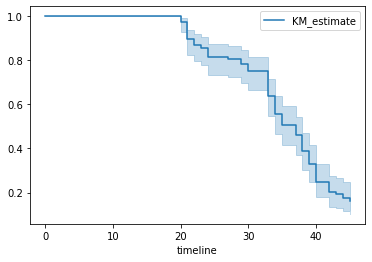

In [226]:
kmf.plot_survival_function()

In [230]:
kmf.median_survival_time_

37.0

In [231]:
kmf.survival_function_

,KM_estimate
timeline,
0.0,1.000000
20.0,0.975806
21.0,0.895161
22.0,0.870968
23.0,0.854839
24.0,0.814516
27.0,0.806452
29.0,0.782258
30.0,0.750000


In [232]:
kmf.predict(38)

0.3870967741935484

In [223]:
wf = WeibullFitter()
wf.fit(df1636_trans['duration'], event_observed= df1636_trans['event'])

<lifelines.WeibullFitter:"Weibull_estimate", fitted with 124 total observations, 20 right-censored observations>

<AxesSubplot: >

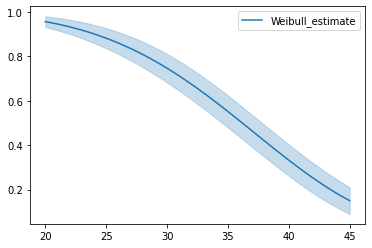

In [225]:
wf.plot_survival_function()

**Log_Rank Test**

The log-rank test is a statistical test used to compare the survival curves of two or more groups. The **null hypothesis of the test is that the survival curves are equal across all groups**. If the p-value of the test is less than the significance level (usually 0.05), we reject the null hypothesis and conclude that there is a significant difference in survival between the groups.

In [157]:
df_1636_final

Week,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event
St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1
Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1
Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1
Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1
Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1
Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0
Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1
St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1


In [178]:
# Define the index intervals and their corresponding categories
intervals = [(0, 97), (97, 114), (114, len(df_1636_final))]
categories = ['Group A', 'Group B', 'Group C']

# Categorize the rows based on their index intervals
for i, (start, end) in enumerate(intervals):
    df_1636_final.loc[start:end, 'Category'] = categories[i]

/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:719: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  indexer = self._get_setitem_indexer(key)


In [161]:
index_list_group1 = df_1636_final.iloc[:97].index.tolist()

print(index_list_group1)

['St Alban Woodstreet - Plague', 'Alhallows Barking - Plague', 'Alhallows Breadstreet - Plague', 'Alhallows Great - Plague', 'Alhallows Honylane - Plague', 'Alhallows Lesse - Plague', 'Alhallows Lumbardstreet - Plague', 'Alhallows Stayning - Plague', 'Alhallows the Wall - Plague', 'St Alphage - Plague', 'St Andrew Hubbard - Plague', 'St Andrew Undershaft - Plague', 'St Andrew Wardrobe - Plague', 'St Ann Aldersgate - Plague', 'St Ann Blackfryers - Plague', 'St Antholins Parish - Plague', 'St Austins Parish - Plague', 'St Bartholomew Exchange - Plague', 'St Bennet Fynck - Plague', 'St Bennet Gracechurch - Plague', 'St Bennet Paulswharf - Plague', 'St Bennet Sherehog - Plague', 'St Botolph Billingsgate - Plague', 'Christ Church - Plague', 'St Christophers - Plague', 'St Clement Eastcheap - Plague', 'St Dionis Backchurch - Plague', 'St Dunstan East - Plague', 'St Edmund Lumbardstr. - Plague', 'St Ethelborough - Plague', 'St Faith - Plague', 'St Foster - Plague', 'St Gabriel Fenchurch - Pla

In [164]:
index_list_group_2 = df_1636_final.iloc[97:114].index.tolist()

print(index_list_group_2)

['St Andrew Holborn - Plague', 'St Bartholomew Great - Plague', 'St Bartholomew Less - Plague', 'St Bridget - Plague', 'Bridewel Precinct - Plague', 'St Botolph Aldersgate - Plague', 'St Botolph Aldgate - Plague', 'St Botolph Bishopsgate - Plague', 'St Dunstan West - Plague', 'St George Southwark - Plague', 'St Giles Cripplegate - Plague', 'St Olave Southwark - Plague', 'Saviours Southwark - Plague', 'S Sepulchres Parish - Plague', 'St Thomas Southwark - Plague', 'Trinity Minories - Plague', 'Pesthouse Without the Walls - Plague']


In [166]:
index_list_group_3 = df_1636_final.iloc[114:125].index.tolist()

print(index_list_group_3)

['St Clement Danes - Plague', 'St Paul Covent Garden - Plague', 'St Giles in the Field - Plague', 'St James Clerkenwel - Plague', 'St Katharine Tower - Plague', 'St Leonard Shoreditch - Plague', 'St Martin in the fields - Plague', 'St Mary Whitechappel - Plague', 'St Magdalen Bermondsey - Plague', 'St Mary Savoy - Plague']


In [179]:
df_1636_final

Week,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event,Category
St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1,Group A
Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1,Group A
Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1,Group A
Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1,Group A
Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1,Group A
Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1,Group A
St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1,Group A


In [180]:
# save the data frame to a CSV file
df_1636_final.to_csv('df_1636_final_03_09_2023.csv', index=True)

In [217]:
# Count censored data
count_0 = len(df_1636_final[df_1636_final['event'] == 0])
count_1 = len(df_1636_final[df_1636_final['event'] == 1])

In [219]:
df_1636_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   parish    124 non-null    object
 1   20        124 non-null    int64 
 2   21        124 non-null    int64 
 3   22        124 non-null    int64 
 4   23        124 non-null    int64 
 5   24        124 non-null    int64 
 6   27        124 non-null    int64 
 7   29        124 non-null    int64 
 8   30        124 non-null    int64 
 9   33        124 non-null    int64 
 10  34        124 non-null    int64 
 11  35        124 non-null    int64 
 12  37        124 non-null    int64 
 13  38        124 non-null    int64 
 14  39        124 non-null    int64 
 15  40        124 non-null    int64 
 16  41        124 non-null    int64 
 17  42        124 non-null    int64 
 18  43        124 non-null    int64 
 19  44        124 non-null    int64 
 20  45        124 non-null    int64 
 21  sum       124 no

In [220]:
20/124 * 100

16.129032258064516

In [221]:
340/1808 * 100 

18.805309734513273

**Checking how to add index and whatnot**

In [ ]:
df_new = df_1636_final

In [187]:
df_new.reset_index(inplace=True)

In [198]:
df_new

Week,parish,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event,Category
0,St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1,Group A
1,Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1,Group A
2,Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1,Group A
3,Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1,Group A
4,Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
5,Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1,Group A
6,Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
7,Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
8,Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1,Group A
9,St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1,Group A


In [204]:
# Reset the index and add a new column 'ID'
df_index = df_index.reset_index(drop=True, col_level=1)

In [213]:
df_index

Week,id,parish,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event,Category
0,1,St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1,Group A
1,2,Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1,Group A
2,3,Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1,Group A
3,4,Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1,Group A
4,5,Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
5,6,Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1,Group A
6,7,Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
7,8,Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
8,9,Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1,Group A
9,10,St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1,Group A


In [212]:
df_index['id'] = df_index['id'].apply(lambda x: x + 1)

In [214]:
df_index.to_csv('df_1636_id_03_11_2023.csv', index=True)